In [20]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
from matplotlib import cm

In [21]:

df = pd.read_csv('지역별.csv',parse_dates=['time'])

In [22]:
for i in df.columns[:-1]:
    df[i] = df[i].apply(lambda x: x.replace(",",""))
    df[i] = df[i].apply(lambda x: x.replace("(",""))
    df[i] = df[i].apply(lambda x: x.replace(")",""))
    df[i] = df[i].apply(lambda x: x.replace("*",""))
    df[i] = df[i].apply(lambda x: x.replace("-",''))
    df[i] = df[i].apply(lambda x: 0 if x=='' else x)

In [23]:
for i in df.columns[1:-1]:
    df[i] = df[i].astype('int')

In [24]:
df1 = df.groupby(['구분','time']).max()

In [25]:
df1

합계   서울  부산    대구  인천  광주  대전  울산  세종   경기  강원  충북   충남  \
구분     time                                                                    
격리중    2020-03-13  7402  185  64  5629  23  11  18  24  32  152  22  23  108   
       2020-03-14  7300  194  63  5538  24  11  18  22  38  161  22  23  106   
       2020-03-15  7253  200  53  5510  26  12  18  22  39  168  21  25  105   
       2020-03-16  7024  201  53  5279  26  12  18  21  40  180  21  25  103   
       2020-03-17  6838  210  52  5094  26  10  18  20  40  204  20  26  100   
...                 ...  ...  ..   ...  ..  ..  ..  ..  ..  ...  ..  ..  ...   
해외유입잠정 2020-05-01     8    1   0     0   1   0   0   0   0    2   0   0    0   
       2020-05-02     6    1   1     0   1   0   0   0   0    0   0   0    0   
       2020-05-03    10    2   0     1   0   0   0   0   0    2   0   0    0   
       2020-05-04     8    0   0     0   1   0   0   1   0    1   0   0    0   
       2020-05-05     3    0   0     0   1   0   0   0   0    0   0   0    0   

                   전북  전남    경북  경남  제주  검역  
구분     time                                  
격리중    2020-03-13   3   3  1028  74   3   0  
       2020-03-14   3   2   998  74   3   0  
       2020-03-15   3   2   977  69   3   0  
       2020-03-16   3   2   969  65   2   4  
       2020-03-17   3   2   941  64   2   6  
...                ..  ..   ...  ..  ..  ..  
해외유입잠정 2020-05-01   0   0     0   0   0   4  
       2020-05-02   0   0     0   0   0   3  
       2020-05-03   0   0     0   0   0   5  
       2020-05-04   0   1     0   0   0   4  
       2020-05-05   0   0     0   0   0   2  

[304 rows x 19 columns]

In [26]:
column = df1.loc[('격리중'),:].columns
index = df1.loc[('격리중'),:].index

In [27]:
index_str = index.strftime('%m.%d')
new_index=[]
for i in range(len(index)):
    if i%2 == 0:
        new_index.append(index_str[i])

## 지역_일 별 격리자 수

Text(0.5, 0, '명')

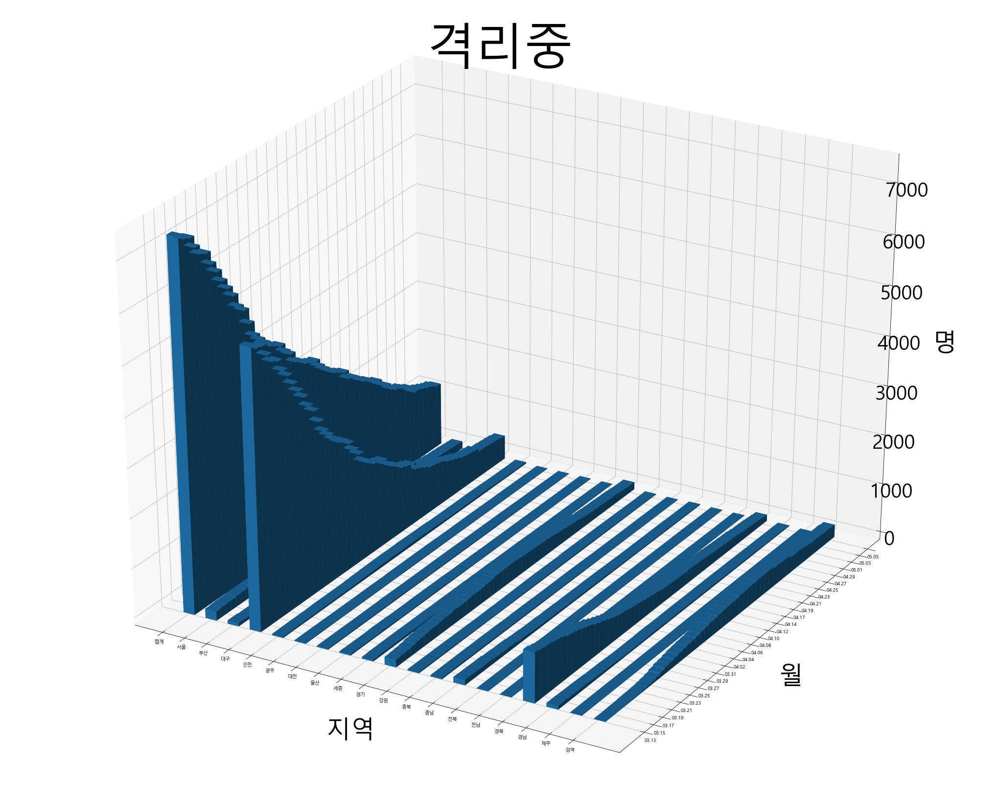

In [9]:
plt.rcParams['font.family'] = 'Malgun Gothic'
fig = plt.figure(figsize=(80, 30))
ax = fig.add_subplot(121, projection='3d')

x = np.arange(len(column))
y = np.arange(len(index))

_xx, _yy = np.meshgrid(x, y)
x, y = _xx.ravel(), _yy.ravel()

z = df1.loc[('격리중'),:].values.flatten()
bottom = np.zeros_like(z)
width = 0.5
depth = 1

ax.bar3d(x, y, bottom, width, depth, z, shade=True)
plt.xticks([i-0.1 for i in range(len(column))], column)
plt.yticks([i*2.01 +1.5 for i in range(len(new_index))], new_index)
for t in ax.zaxis.get_major_ticks(): t.label.set_fontsize(40)
ax.set_title('격리중',size=100)
ax.set_xlabel('지역',size=50,labelpad=50)
ax.set_ylabel('월',size=50,labelpad=50)
ax.set_zlabel('명',size=50,labelpad=50)

## 지역_월 별 격리자 수

Text(0.5, 0, '명')

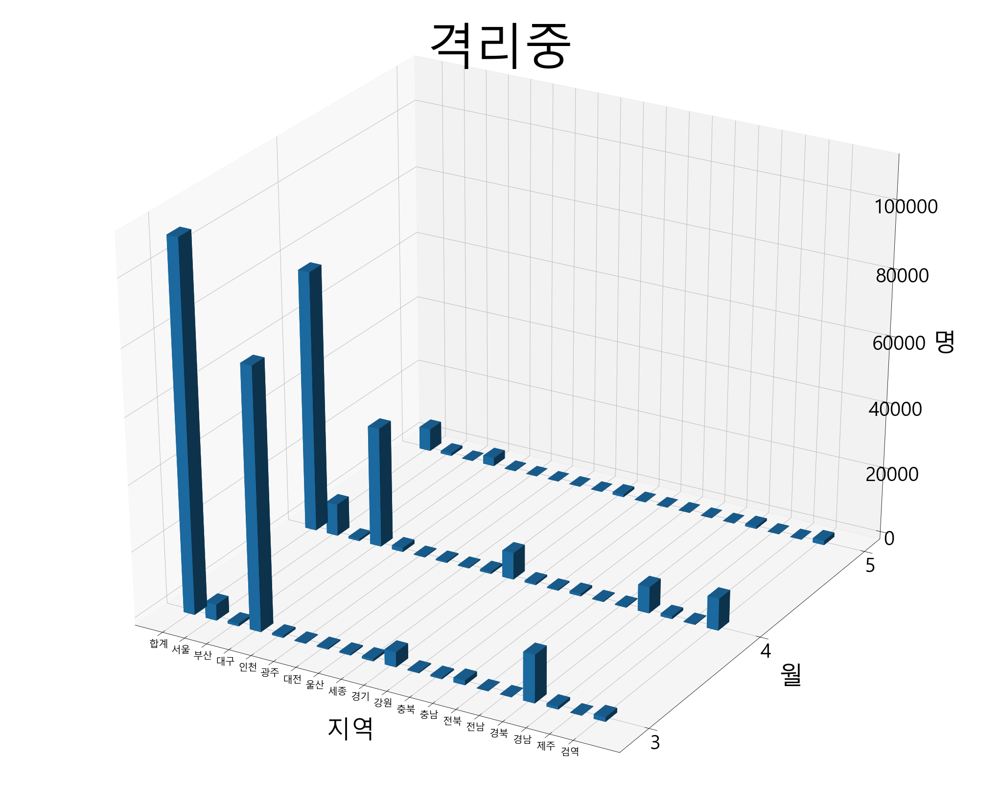

In [10]:
df2 = df.copy()
df2.time = df2.time.apply(lambda x : x.month)
df2 = df2.groupby(['구분','time']).sum()

column = df2.loc[('격리중'),:].columns
index = df2.loc[('격리중'),:].index

plt.rcParams['font.family'] = 'Malgun Gothic'
fig = plt.figure(figsize=(80, 30))
ax = fig.add_subplot(121, projection='3d')

x = np.arange(len(column))
y = np.arange(len(index))

_xx, _yy = np.meshgrid(x, y)
x, y = _xx.ravel(), _yy.ravel()

z = df2.loc[('격리중'),:].values.flatten()
bottom = np.zeros_like(z)
width = 0.5
depth = 0.1

ax.bar3d(x, y, bottom, width, depth, z, shade=True)
plt.xticks([i-0.1 for i in range(len(column))], column,size=20)
plt.yticks([i+0.1 for i in range(len(index))], index,size=40)
for t in ax.zaxis.get_major_ticks(): t.label.set_fontsize(40)
ax.set_title('격리중',size=100)
ax.set_xlabel('지역',size=50,labelpad=50)
ax.set_ylabel('월',size=50,labelpad=50)
ax.set_zlabel('명',size=50,labelpad=50)


In [11]:
def f_월별(구분):
    df2 = df.copy()
    df2.time = df2.time.apply(lambda x : x.month)
    df2 = df2.groupby(['구분','time']).sum()

    column = df2.loc[(구분),:].columns
    index = df2.loc[(구분),:].index
    
    plt.rcParams['font.family'] = 'Malgun Gothic'
    fig = plt.figure(figsize=(80, 30))
    ax = fig.add_subplot(121, projection='3d')

    x = np.arange(len(column))
    y = np.arange(len(index))

    _xx, _yy = np.meshgrid(x, y)
    x, y = _xx.ravel(), _yy.ravel()

    z = df2.loc[(구분),:].values.flatten()
    bottom = np.zeros_like(z)
    width = 0.5
    depth = 0.1

    ax.bar3d(x, y, bottom, width, depth, z, shade=True)
    plt.xticks([i-0.1 for i in range(len(column))], column,size =20)
    plt.yticks([i+0.1 for i in range(len(index))], index,size =40)
    
    ax.set_title(구분,size = 100)
    ax.set_xlabel('지역',size=50,labelpad=50)
    ax.set_ylabel('월',size=50,labelpad=50)
    ax.set_zlabel('명',size=50,labelpad=50)
    for t in ax.zaxis.get_major_ticks(): t.label.set_fontsize(40)

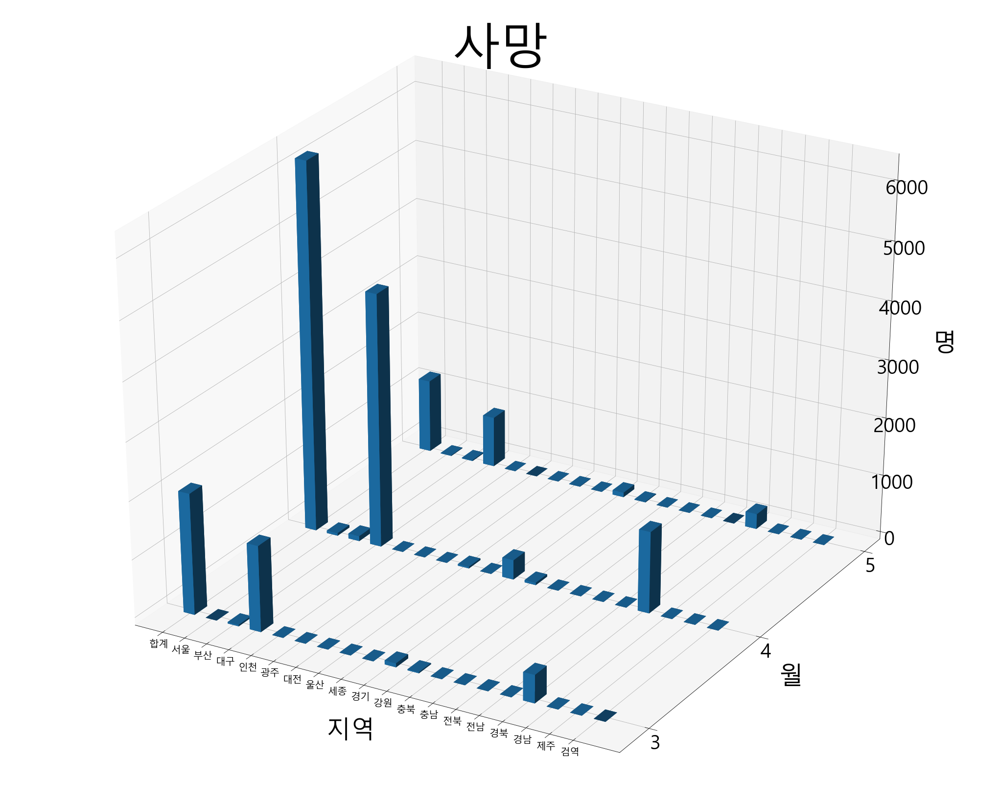

In [12]:
f_월별('사망')

In [13]:
def f_일별(구분):
    column = df1.loc[(구분),:].columns
    index = df1.loc[(구분),:].index

    index_str = index.strftime('%m.%d')
    new_index=[]
    for i in range(len(index)):
        if i%2 == 0:
            new_index.append(index_str[i])

    plt.rcParams['font.family'] = 'Malgun Gothic'
    fig = plt.figure(figsize=(80, 30))
    ax = fig.add_subplot(121, projection='3d')

    x = np.arange(len(column))
    y = np.arange(len(index))

    _xx, _yy = np.meshgrid(x, y)
    x, y = _xx.ravel(), _yy.ravel()

    z = df1.loc[(구분),:].values.flatten()
    bottom = np.zeros_like(z)
    width = 0.5
    depth = 1

    ax.bar3d(x, y, bottom, width, depth, z, shade=True)
    plt.xticks([i-0.1 for i in range(len(column))], column,size =20)
    plt.yticks([i*2.05 +1.5 for i in range(len(new_index))], new_index)
    
    ax.set_title(구분,size = 100)
    ax.set_xlabel('지역',size=50,labelpad=50)
    ax.set_ylabel('월',size=50,labelpad=50)
    ax.set_zlabel('명',size=50,labelpad=50)
    for t in ax.zaxis.get_major_ticks(): t.label.set_fontsize(40)

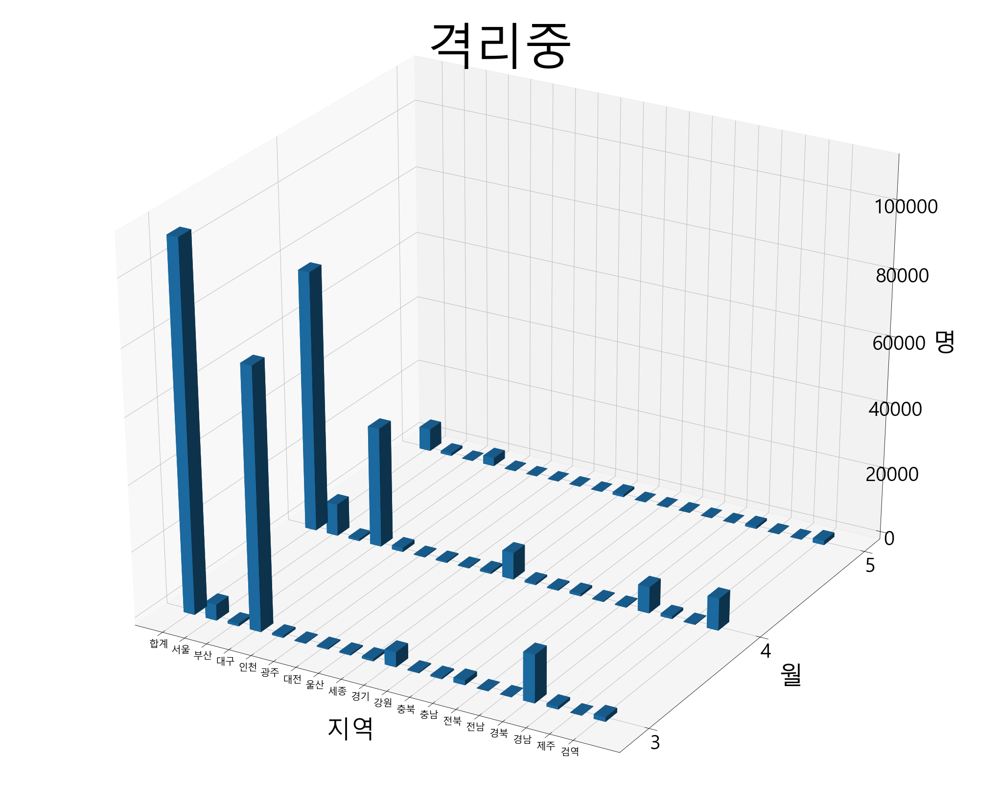

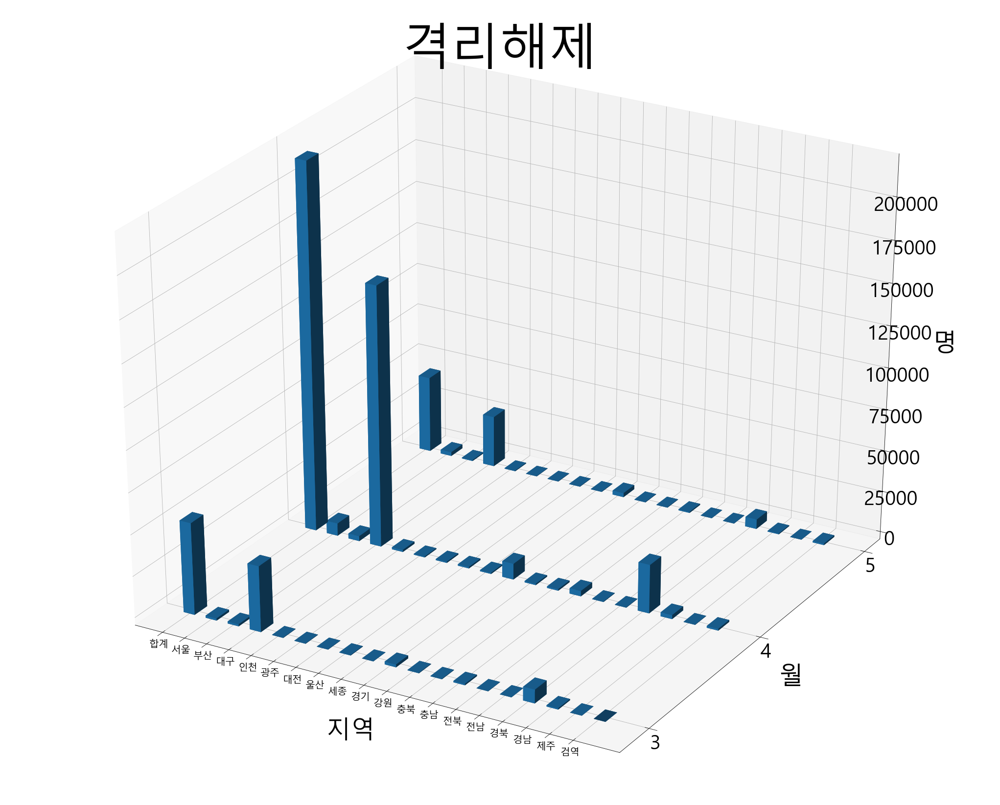

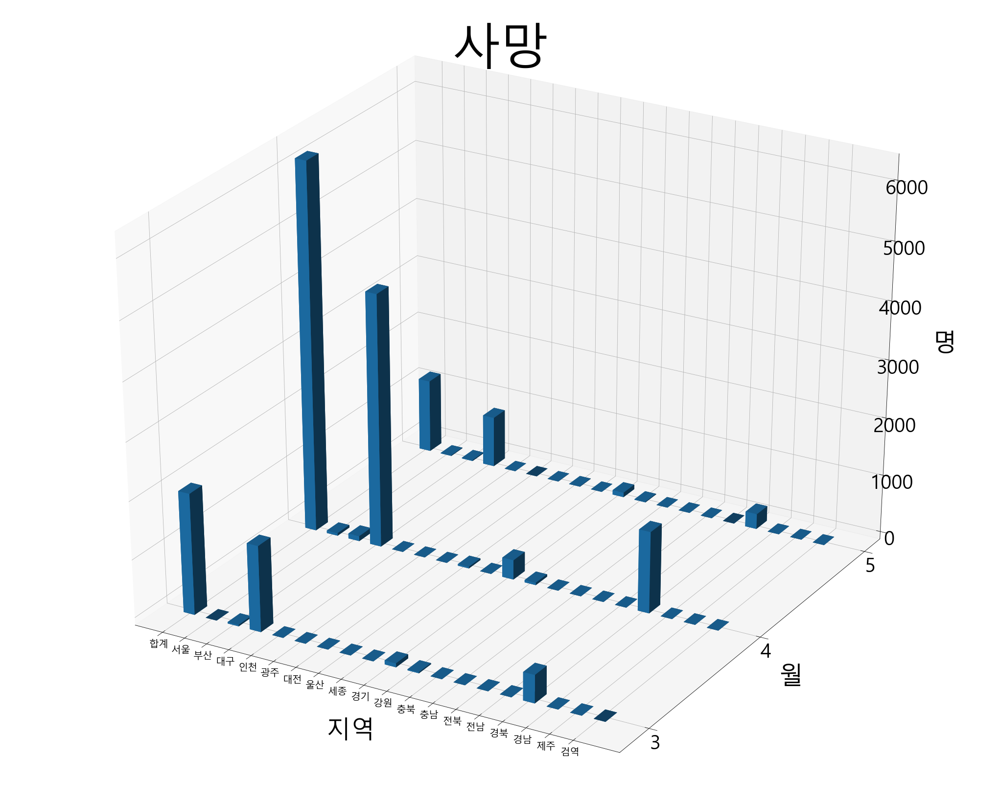

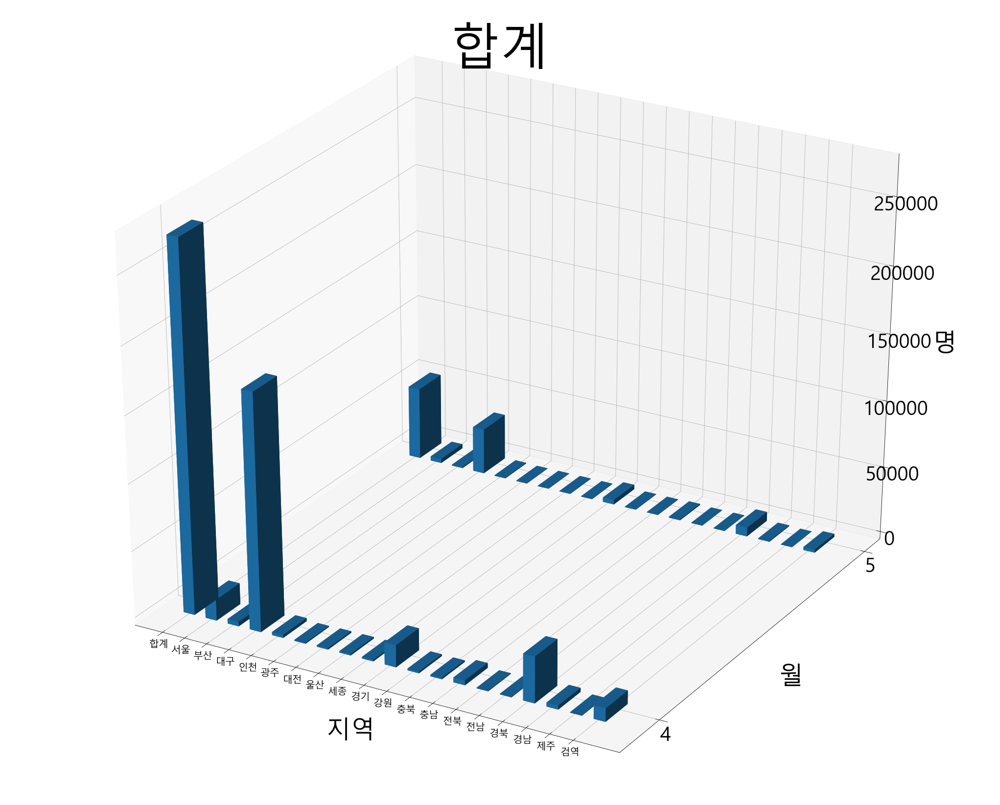

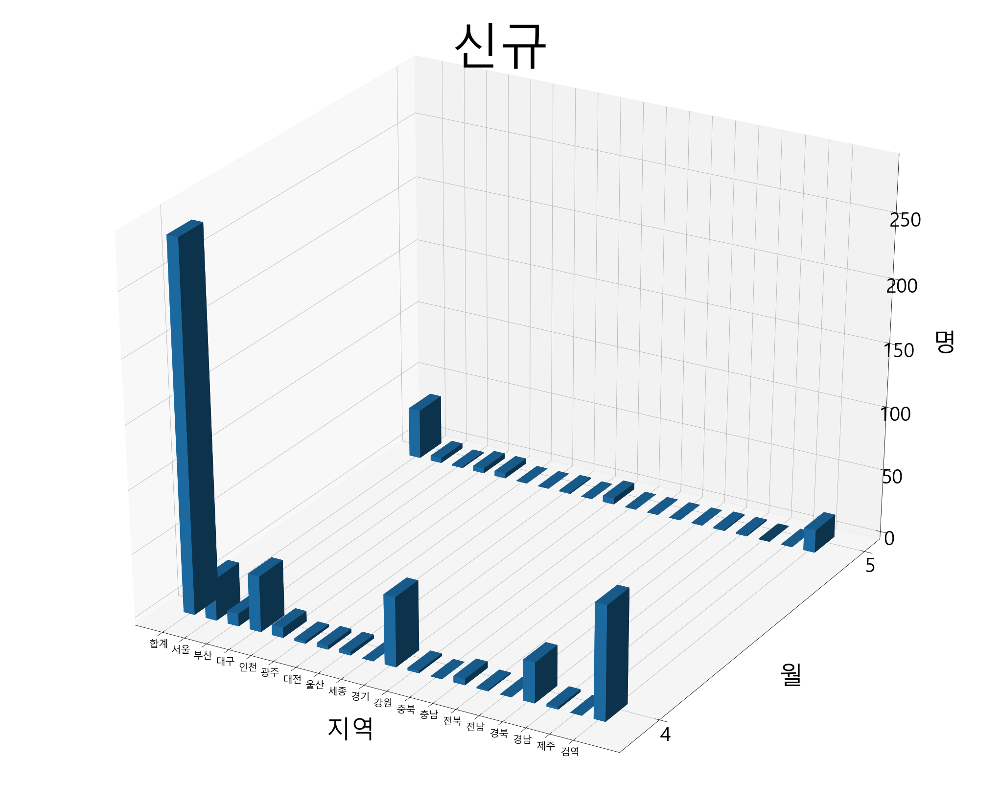

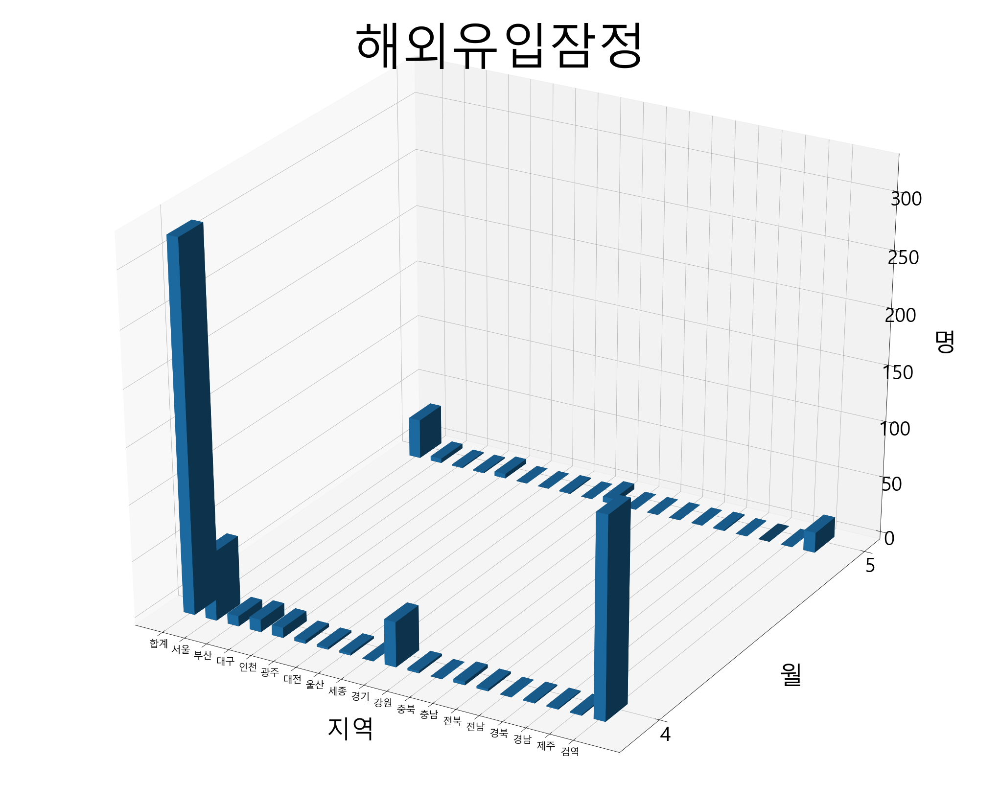

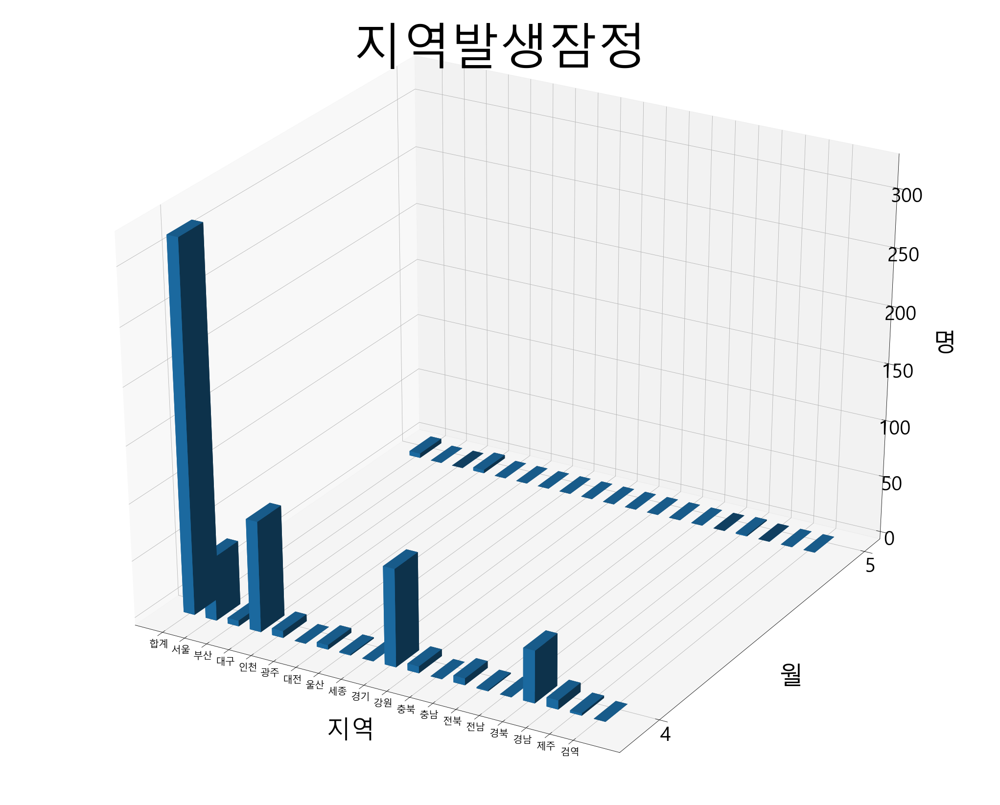

In [14]:
for i in df['구분'][:7]:
    f_월별(i)

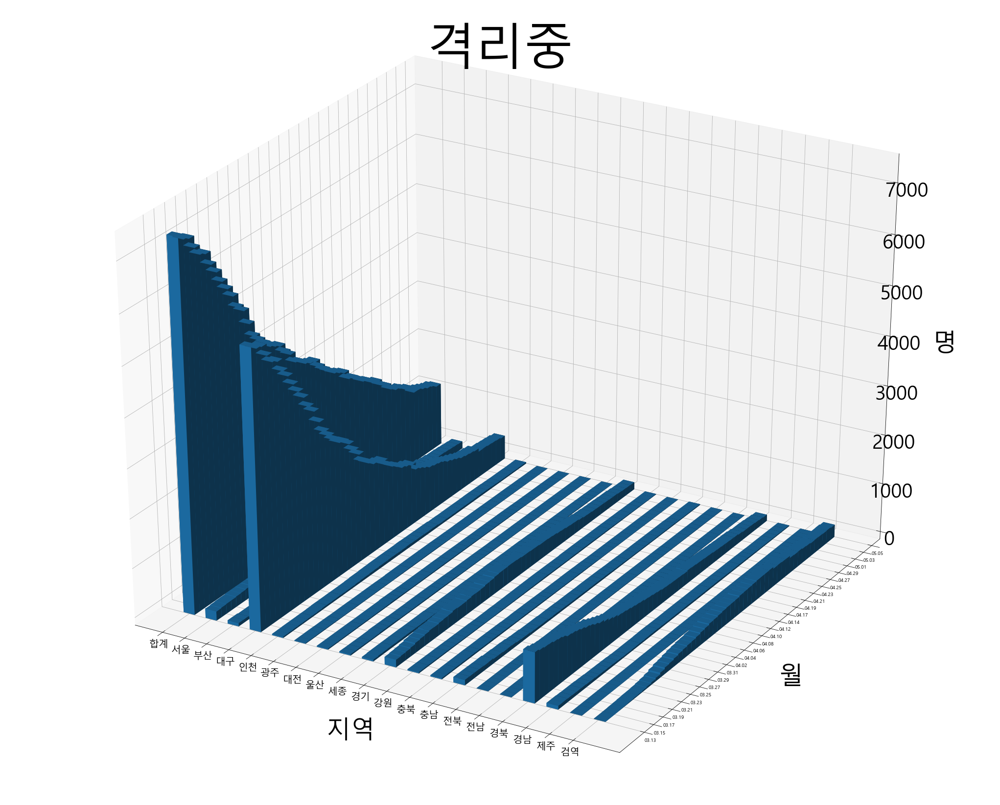

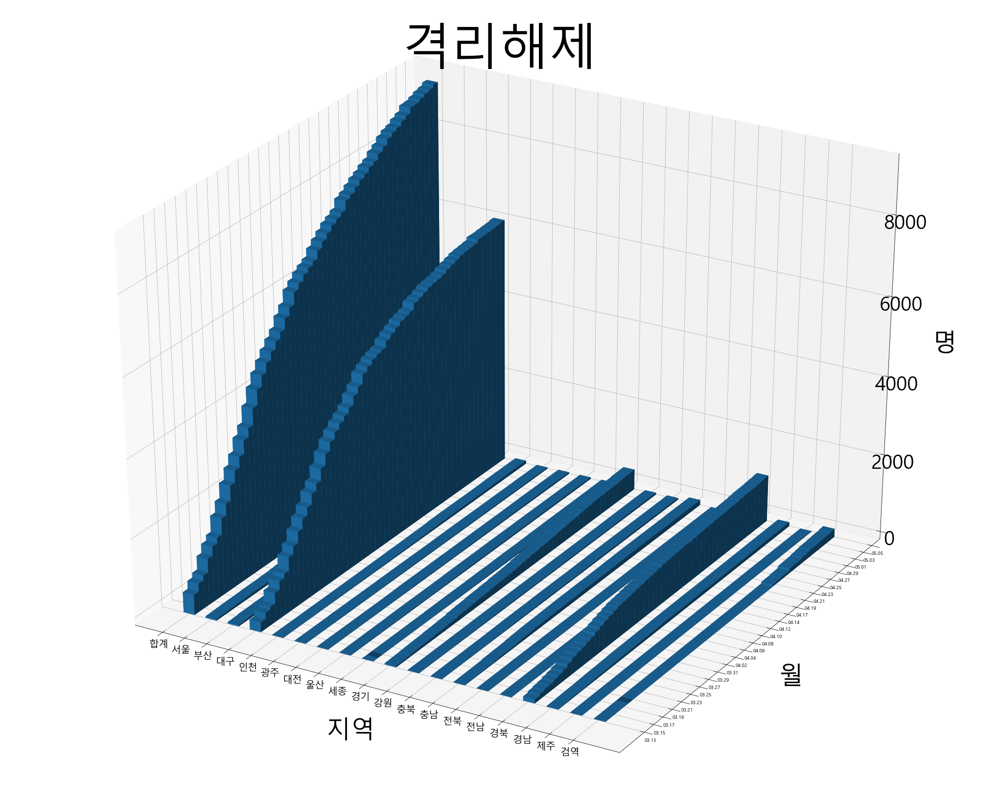

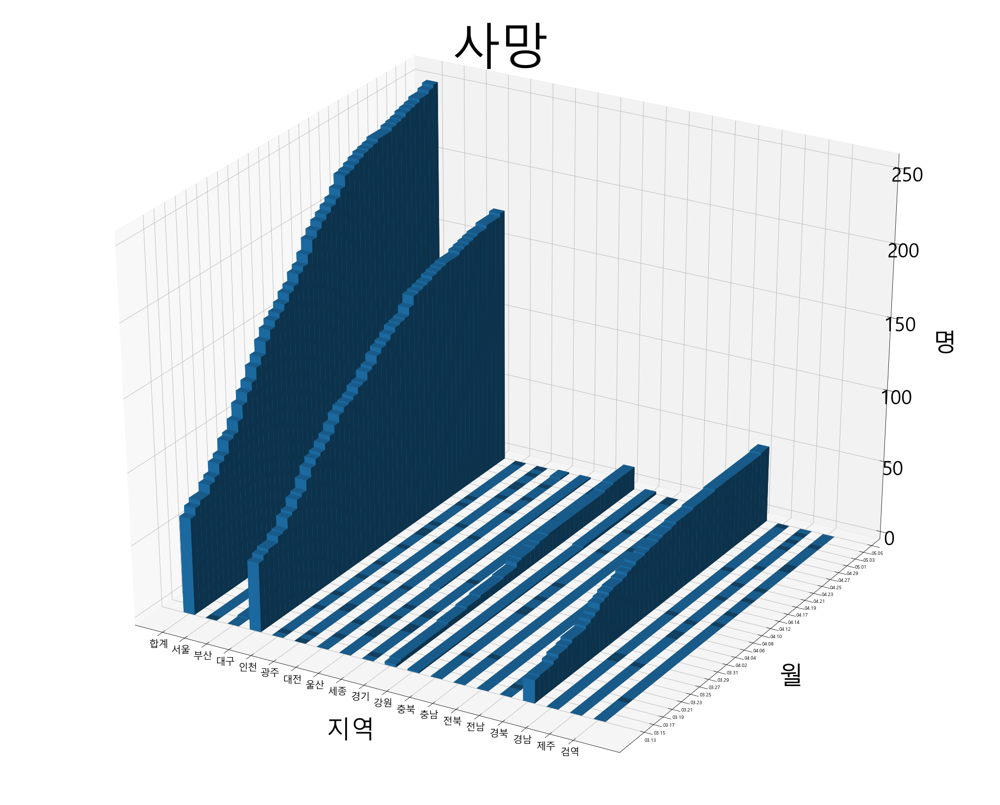

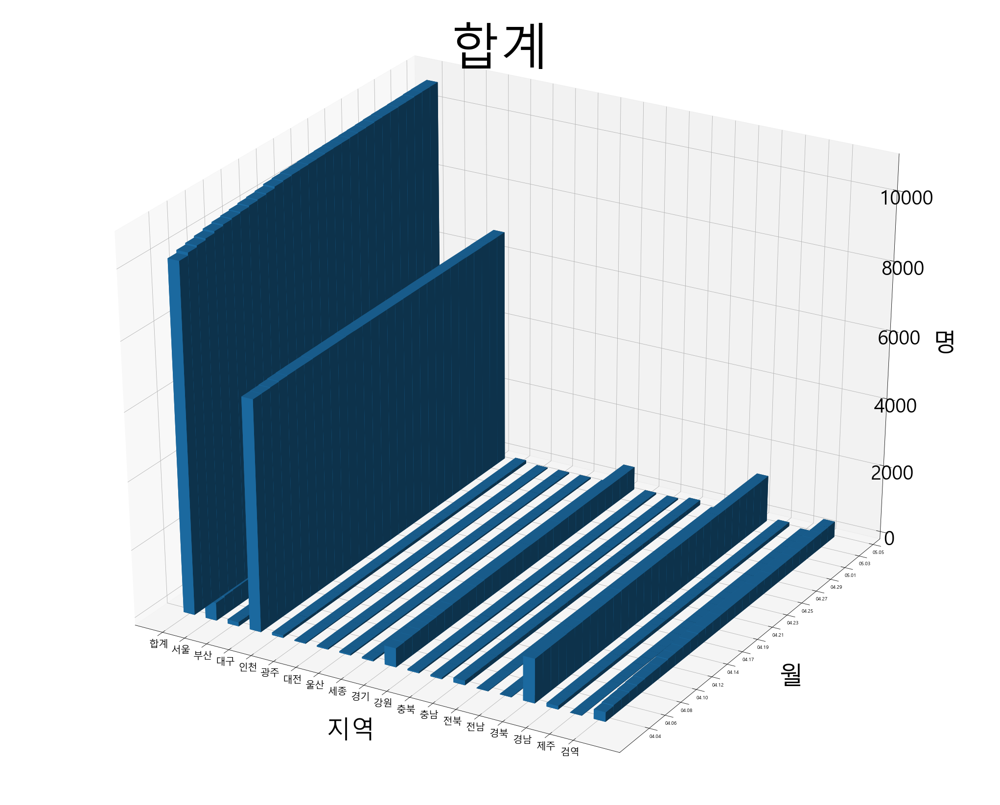

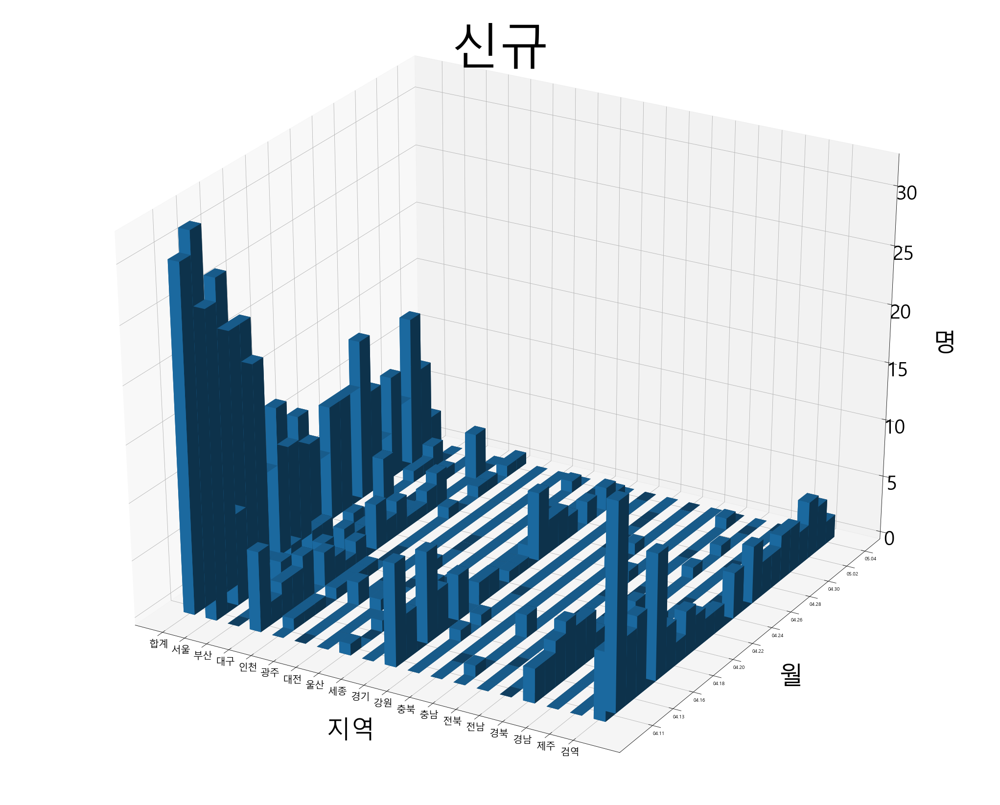

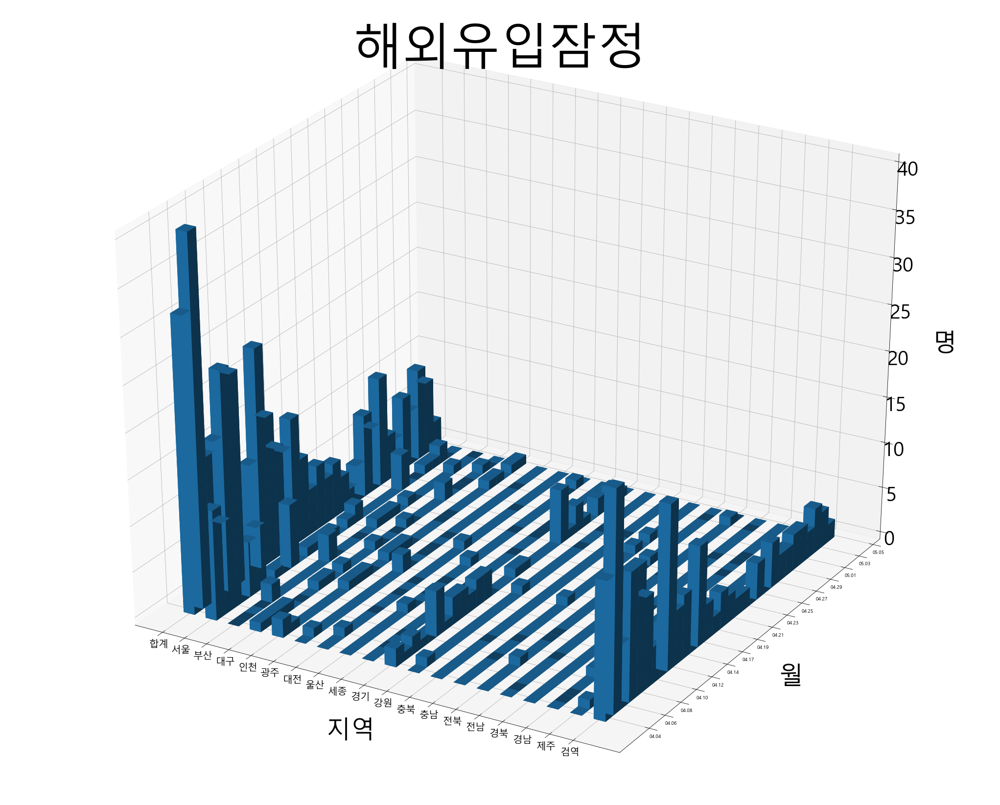

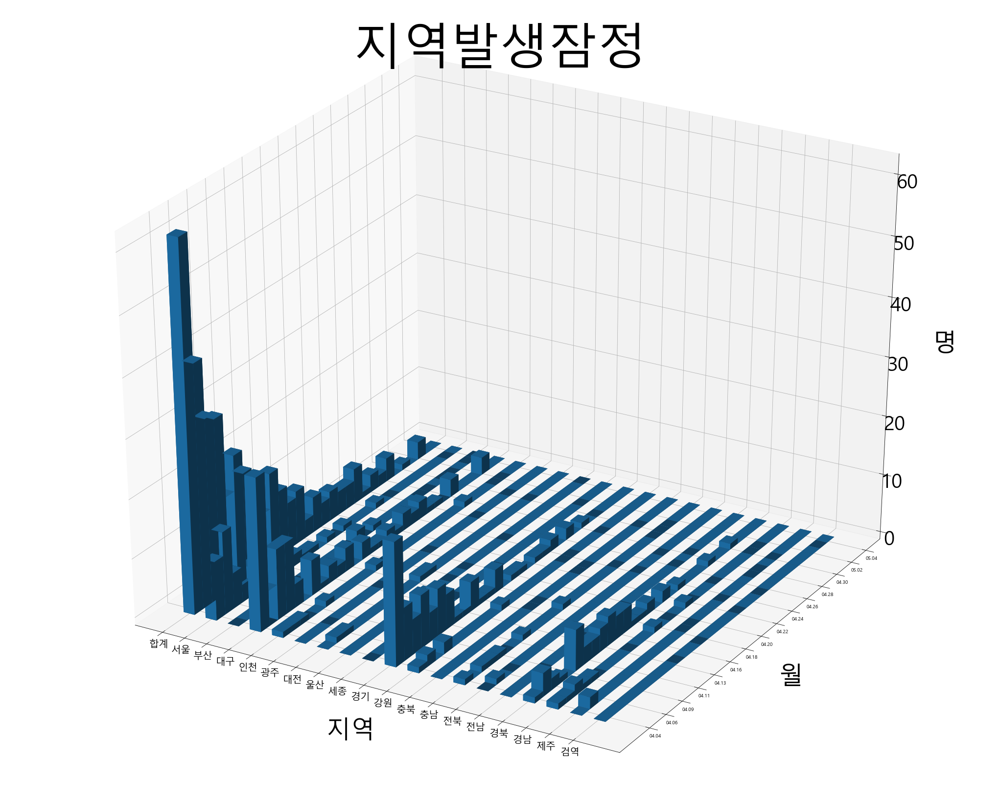

In [15]:
for i in df['구분'][:7]:
    f_일별(i)

In [35]:
def f_일별(구분):
    column = df1.loc[(구분),:].columns
    index = df1.loc[(구분),:].index

    index_str = index.strftime('%m.%d')
    new_index=[]
    for i in range(len(index)):
        if i%2 == 0:
            new_index.append(index_str[i])

    plt.rcParams['font.family'] = 'Malgun Gothic'
    fig = plt.figure(figsize=(80, 30))
    ax = fig.add_subplot(121, projection='3d')

    x = np.arange(len(column))
    y = np.arange(len(index))

    _xx, _yy = np.meshgrid(x, y)
    x, y = _xx.ravel(), _yy.ravel()

    z = df1.loc[(구분),:].values.flatten()
    bottom = np.zeros_like(z)
    width = 0.5
    depth = 1
    
    cmap = cm.get_cmap('jet')
    max_height = np.max(z)
    min_height = np.min(z)
    rgba = [cmap((k-min_height)/max_height) for k in z] 

    ax.bar3d(x, y, bottom, width, depth, z, shade=True,color=rgba)
    plt.xticks([i-0.1 for i in range(len(column))], column,size =20)
    plt.yticks([i*2.05 +1.5 for i in range(len(new_index))], new_index)
    
    ax.set_title(구분,size = 100)
    ax.set_xlabel('지역',size=50,labelpad=50)
    ax.set_ylabel('월',size=50,labelpad=50)
    ax.set_zlabel('명',size=50,labelpad=50)
    for t in ax.zaxis.get_major_ticks(): t.label.set_fontsize(40)

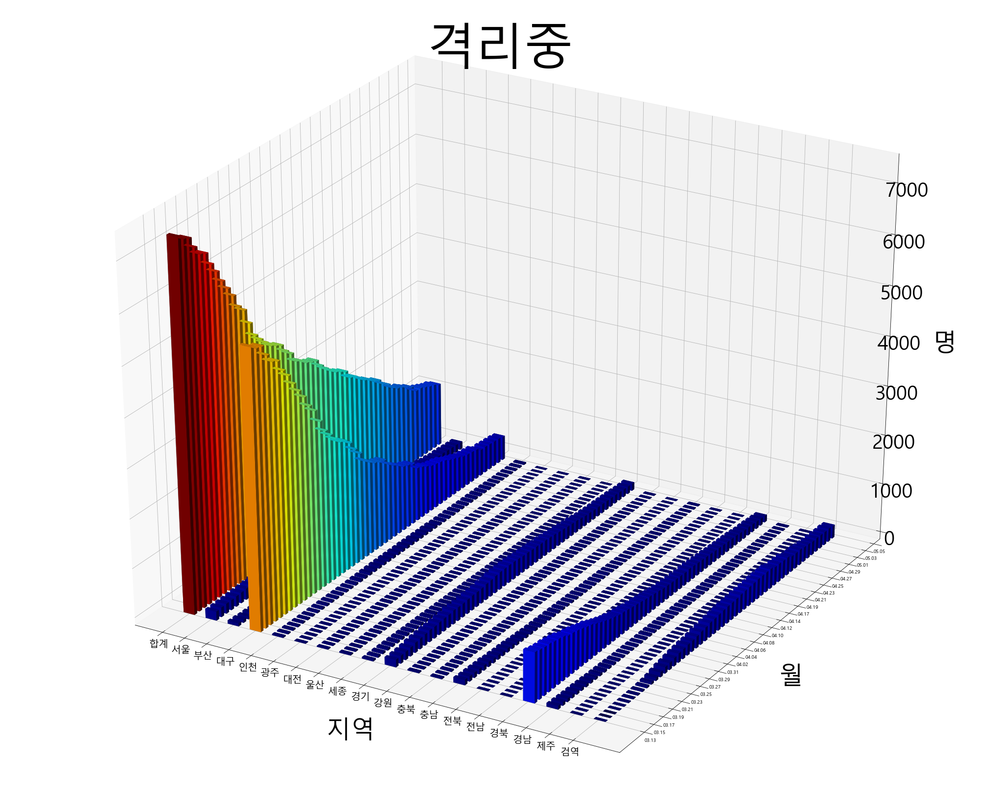

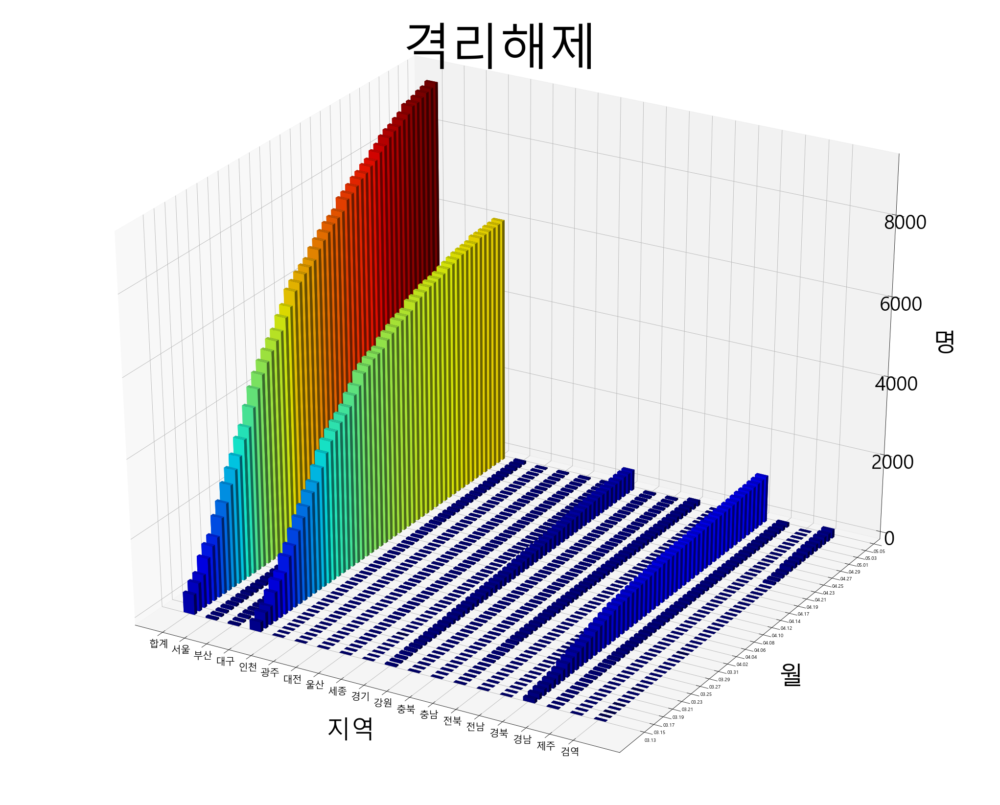

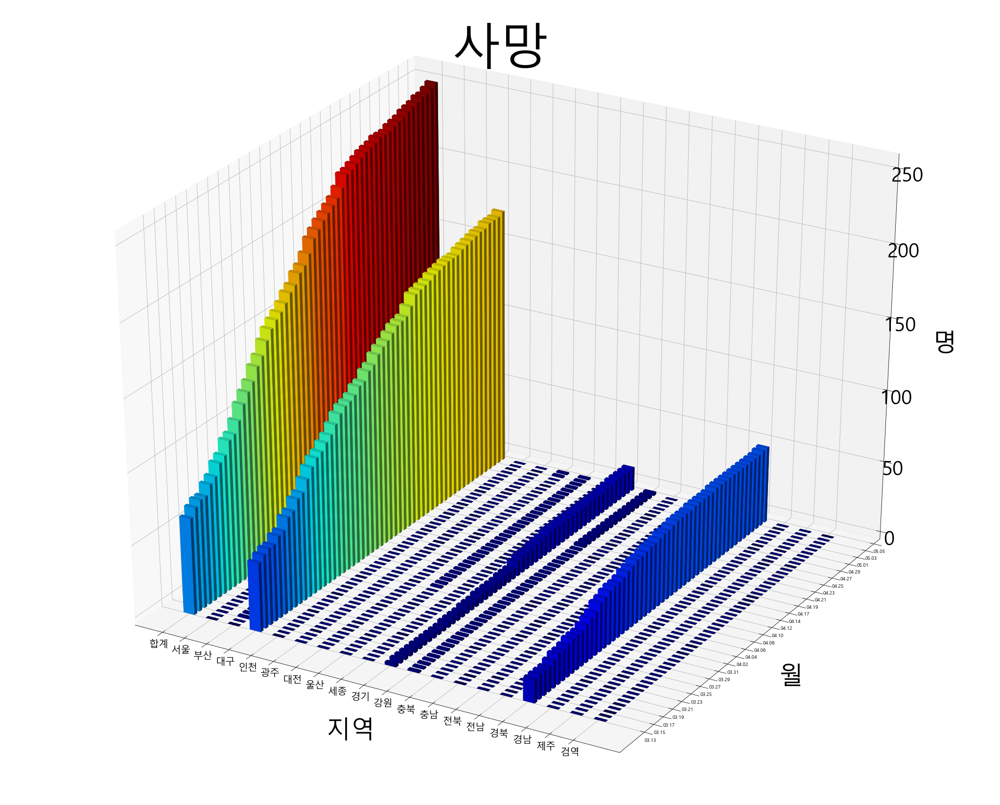

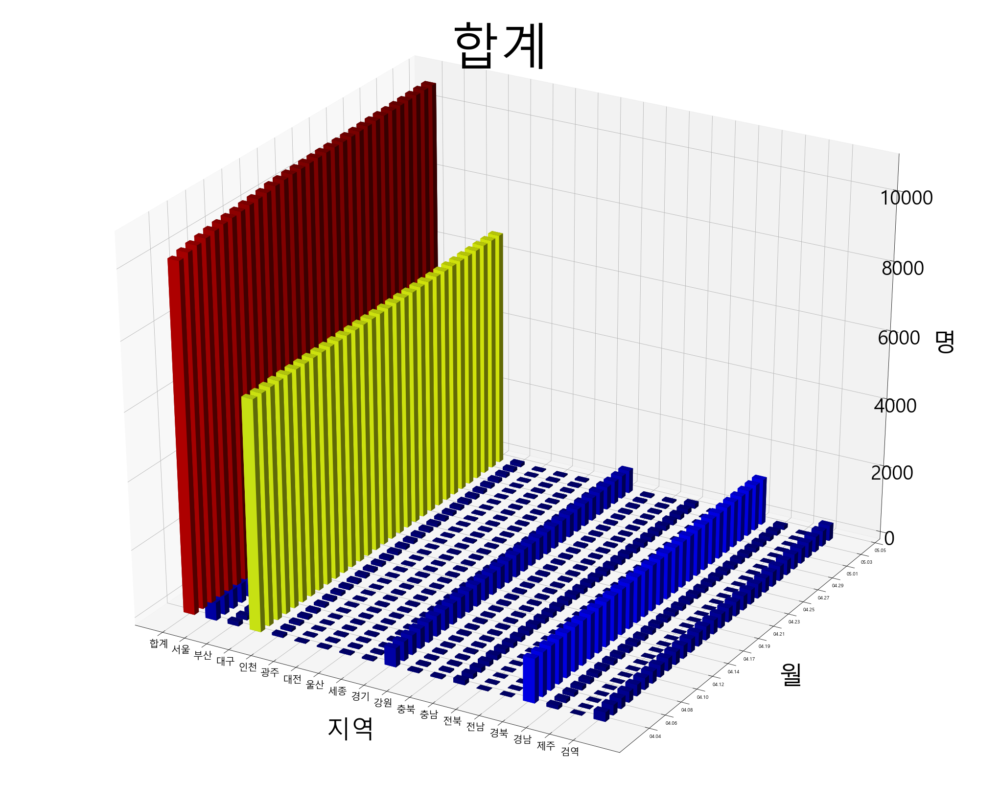

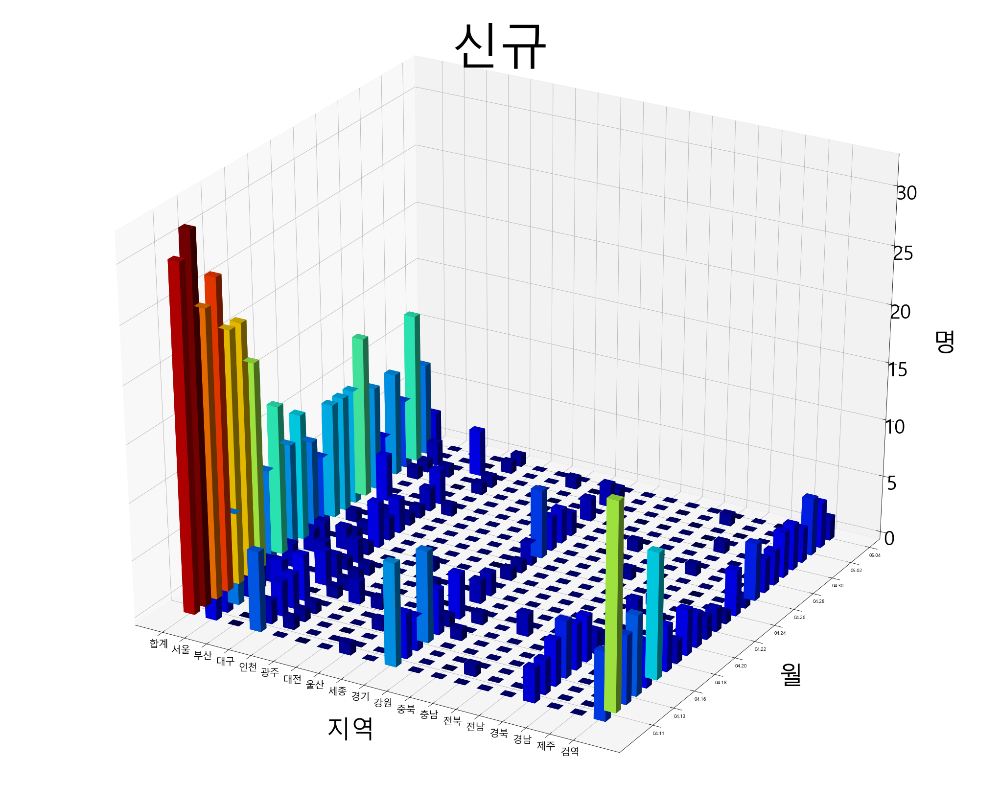

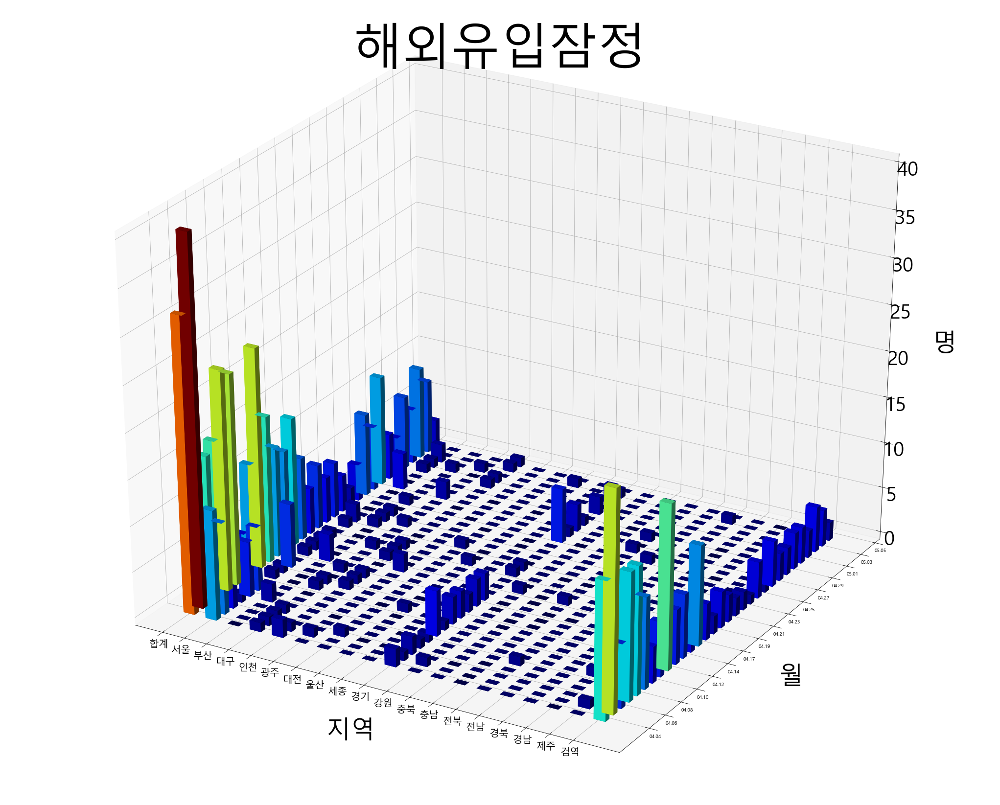

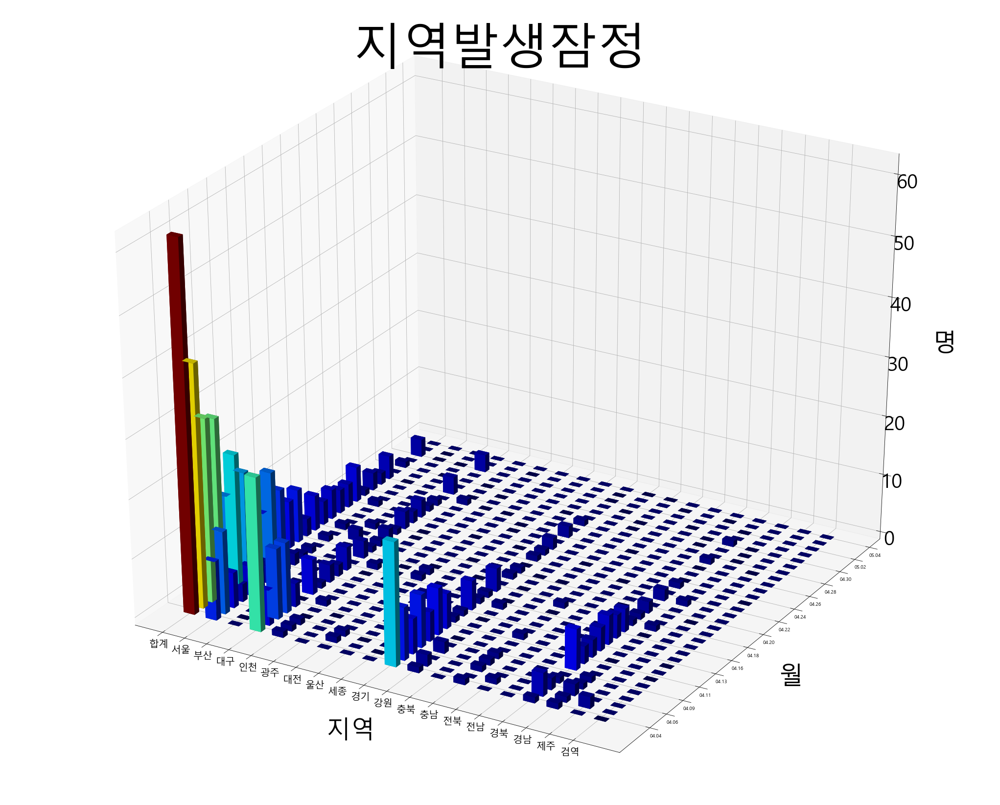

In [36]:
for i in df['구분'][:7]:
    f_일별(i)

In [29]:
def f_월별(구분):
    df2 = df.copy()
    df2.time = df2.time.apply(lambda x : x.month)
    df2 = df2.groupby(['구분','time']).sum()

    column = df2.loc[(구분),:].columns
    index = df2.loc[(구분),:].index
    
    plt.rcParams['font.family'] = 'Malgun Gothic'
    fig = plt.figure(figsize=(80, 30))
    ax = fig.add_subplot(121, projection='3d')

    x = np.arange(len(column))
    y = np.arange(len(index))

    _xx, _yy = np.meshgrid(x, y)
    x, y = _xx.ravel(), _yy.ravel()

    z = df2.loc[(구분),:].values.flatten()
    bottom = np.zeros_like(z)
    width = 0.5
    depth = 0.1

    cmap = cm.get_cmap('jet')
    max_height = np.max(z)
    min_height = np.min(z)
    rgba = [cmap((k-min_height)/max_height) for k in z] 
    
    ax.bar3d(x, y, bottom, width, depth, z, shade=True, color = rgba)
    plt.xticks([i-0.1 for i in range(len(column))], column,size =20)
    plt.yticks([i+0.1 for i in range(len(index))], index,size =40)
    
    ax.set_title(구분,size = 100)
    ax.set_xlabel('지역',size=50,labelpad=50)
    ax.set_ylabel('월',size=50,labelpad=50)
    ax.set_zlabel('명',size=50,labelpad=50)
    for t in ax.zaxis.get_major_ticks(): t.label.set_fontsize(40)

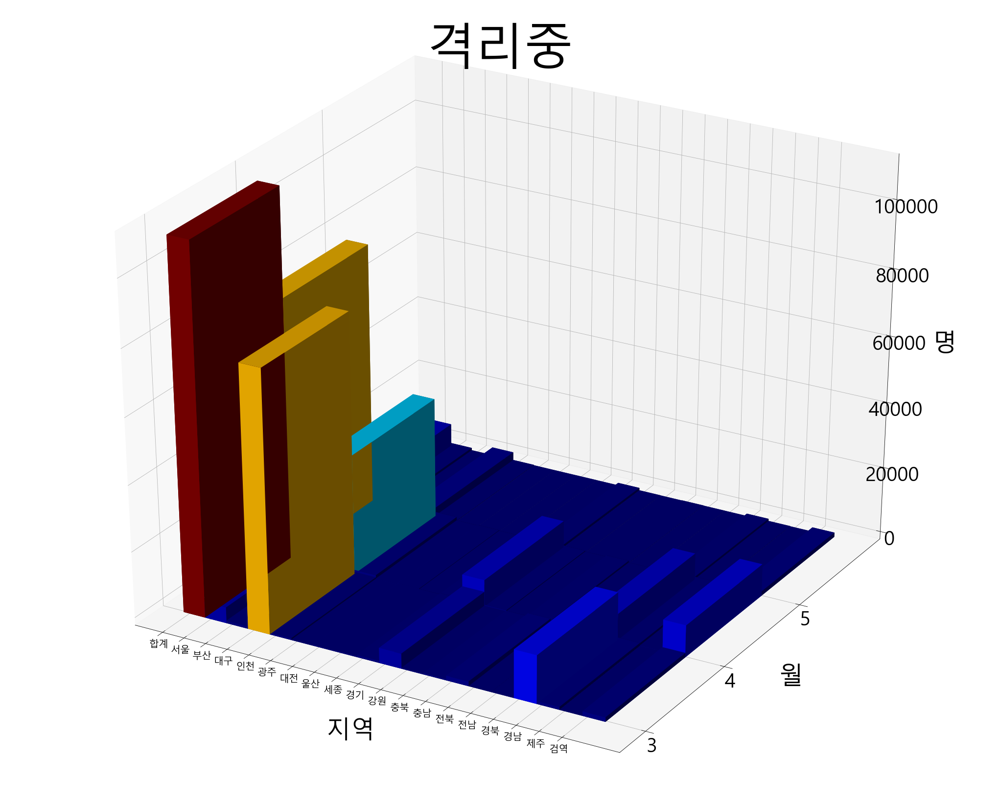

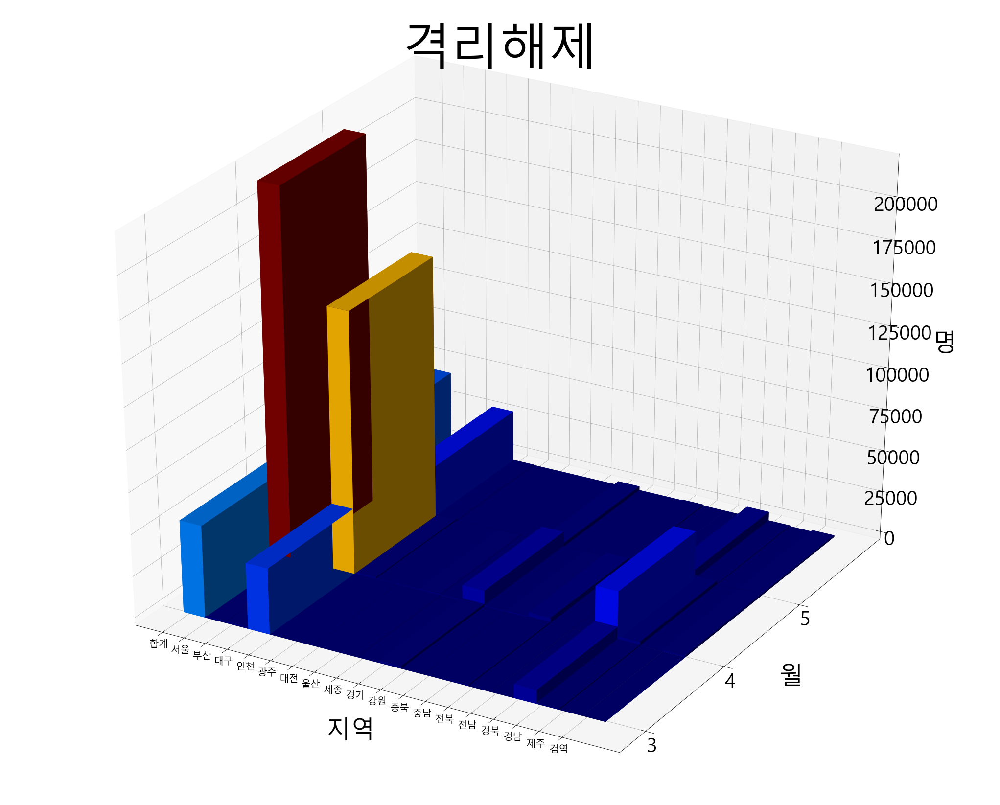

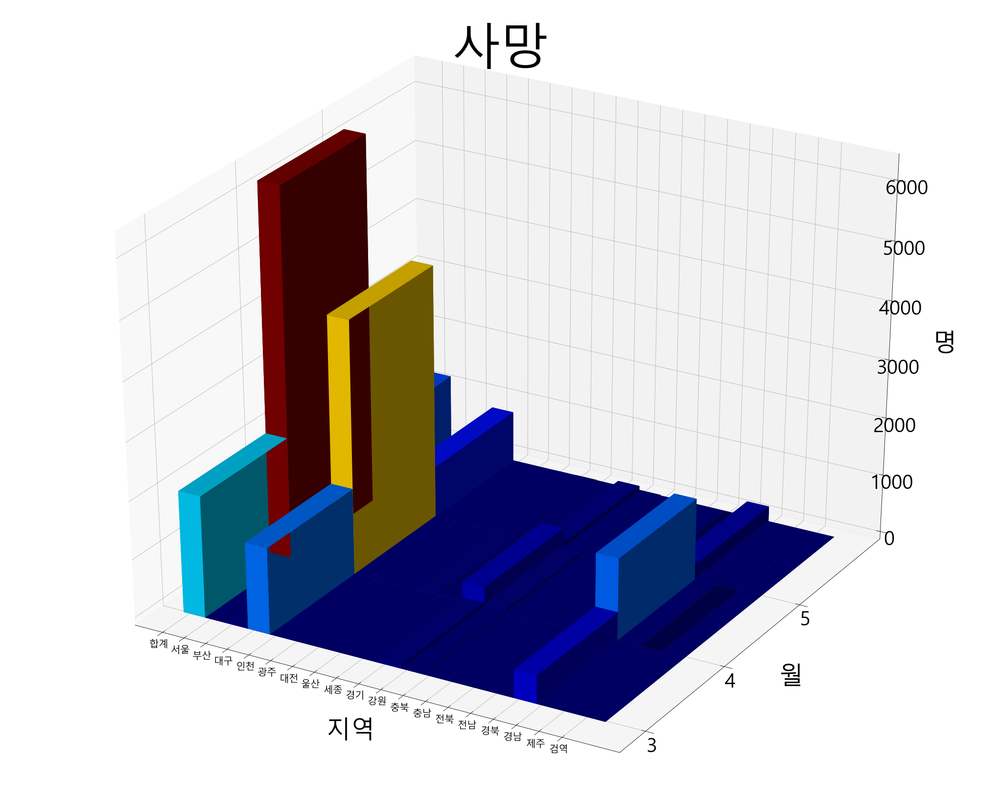

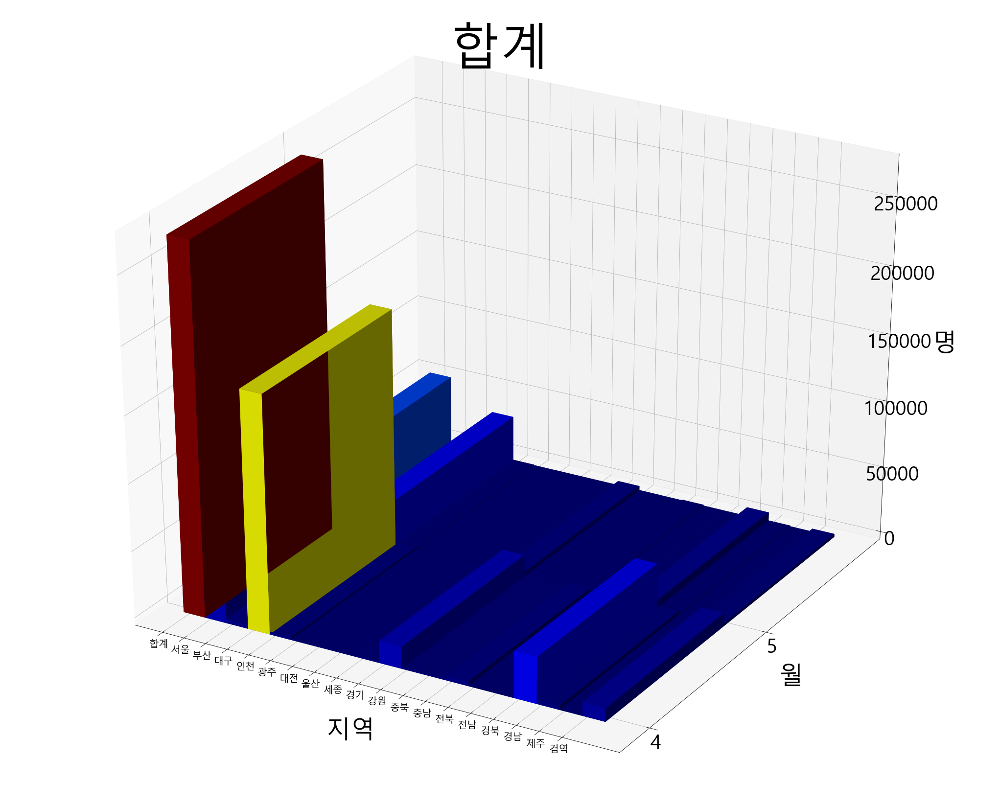

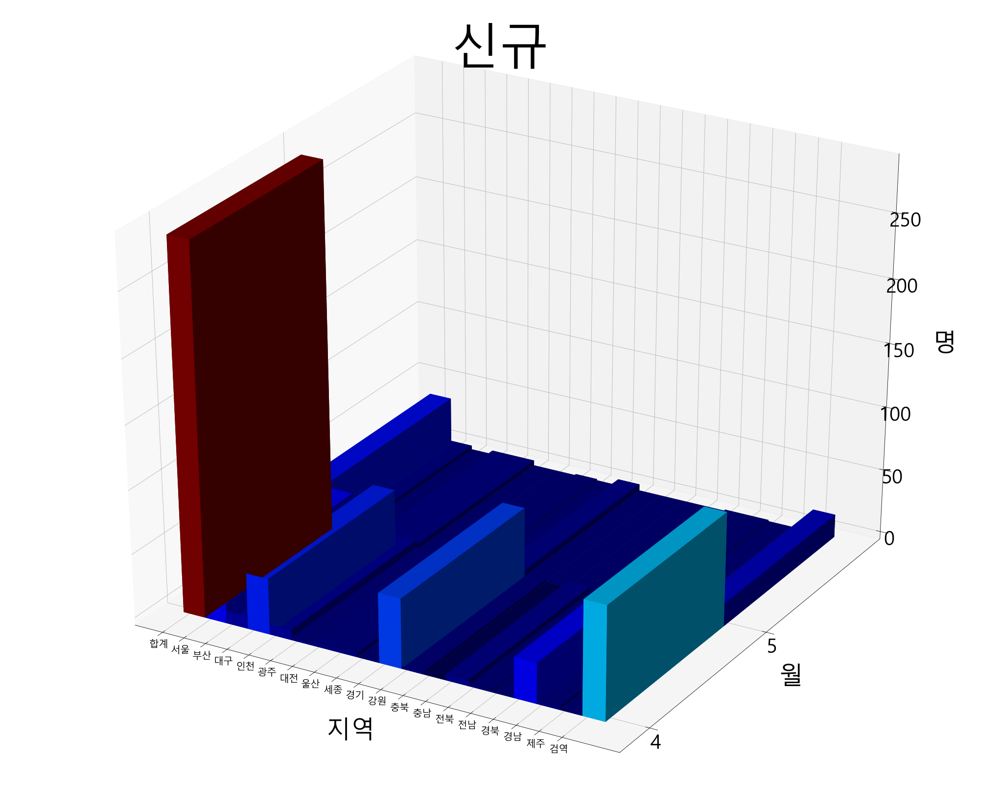

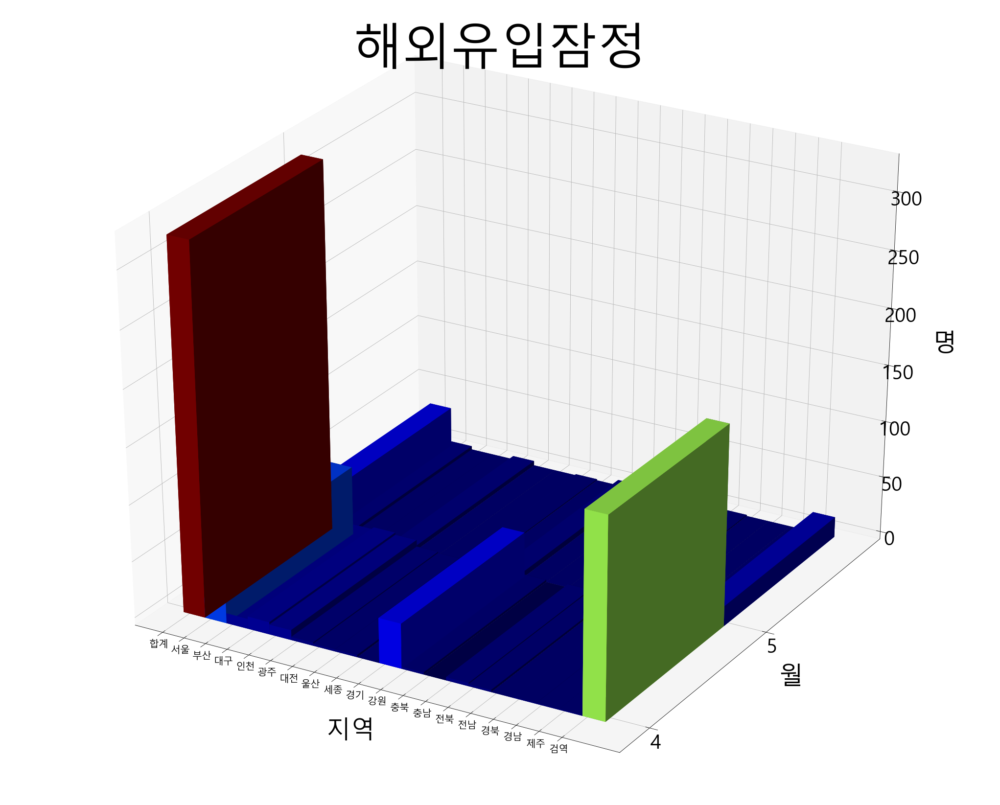

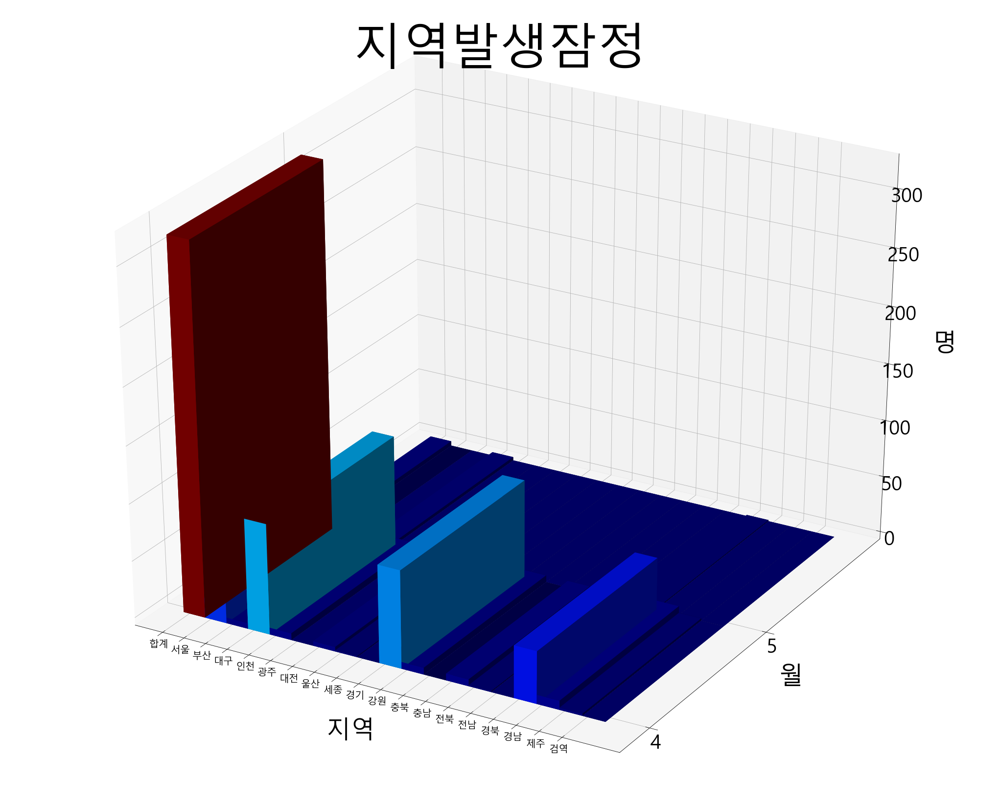

In [30]:
for i in df['구분'][:7]:
    f_월별(i)